<a href="https://colab.research.google.com/github/DonghweeYoon/Simple-similar-image-search-tutorial/blob/main/Simple_similar_image_search_tutorial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 1. Environment Setting

In [ ]:
!pip install pytorch-fid

Define a feature extractor based on Inception V3

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
from pytorch_fid.inception import InceptionV3
import torchvision.transforms as transforms

DEFAULT_FEAT_INDEX = 3

class feat_extractor(nn.Module):
    def __init__(
            self,
            feat_index=DEFAULT_FEAT_INDEX,
            resize_input=True,
            normalize_input=True,
            requires_grad=False,
            use_fid_inception=True
        ):
        super(feat_extractor, self).__init__()

        self.net = InceptionV3(output_blocks=(feat_index,),
                            resize_input=resize_input,
                            normalize_input=normalize_input,
                            requires_grad=requires_grad,
                            use_fid_inception=use_fid_inception)

    def forward(self, x):
        return self.net(x)[0]

**feat_index (Inception V3)**: Indices of blocks to return features of.

Possible values are
* 0: corresponds to output of first max pooling
* 1: corresponds to output of second max pooling
* 2: corresponds to output which is fed to aux classifier
* 3: corresponds to output of final average pooling





In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
tf = transforms.ToTensor()

feat_index = 2

model = feat_extractor(feat_index=feat_index).to(device)

Downloading: "https://github.com/mseitzer/pytorch-fid/releases/download/fid_weights/pt_inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/pt_inception-2015-12-05-6726825d.pth
100%|██████████| 91.2M/91.2M [00:05<00:00, 16.7MB/s]


## 2. Search algorithm

In [4]:
def extract_features(images):
    feats = list()

    for image in images:
        image_t = tf(image).unsqueeze(0).to(device)
        feats.append(model(image_t).cpu())

    return feats

def compute_dist(query_image, feats):
    query_image_t = tf(query_image).unsqueeze(0).to(device)
    query_feat = model(query_image_t).cpu()

    # Compute distance
    dists = list()
    for feat in feats:
        dists.append(np.linalg.norm(query_feat - feat))

    return dists

def sort_by_dist(images, dists):
    dists, images = zip(*sorted(zip(dists, images)))

    return images, dists

## 3. Results



**Dataset**

The image dataset is Animal Faces-HQ (AFHQ).

I randomly select 500 samples from the *wild* category images.

Images consist of diverse wildlife such as lions, tigers, and wolves.

---

Full dataset link: https://www.kaggle.com/datasets/andrewmvd/animal-faces

Reference: Choi, Y., Uh, Y., Yoo, J., & Ha, J. W. (2020). Stargan v2: Diverse image synthesis for multiple domains. In Proceedings of the IEEE/CVF conference on computer vision and pattern recognition (pp. 8188-8197).


In [5]:
import gdown

# Download images
# google shaired file https://drive.google.com/file/d/1cAGjdb9Wy_bqhlEpJT78C6zGXlog11O5/view?usp=drive_link
!gdown 1cAGjdb9Wy_bqhlEpJT78C6zGXlog11O5
!unzip -q /content/wild.zip

Downloading...
From: https://drive.google.com/uc?id=1cAGjdb9Wy_bqhlEpJT78C6zGXlog11O5
To: /content/wild.zip
100% 25.1M/25.1M [00:00<00:00, 91.6MB/s]


Extract features from the images

In [6]:
import PIL
import os, random
import matplotlib.pyplot as plt

image_path = "/content/wild"

images = list()

for path, _, files in os.walk(image_path):
    for file_name in files:
        images.append(PIL.Image.open(os.path.join(image_path, file_name)))

feats = extract_features(images)

Pick a query image randomly from the images

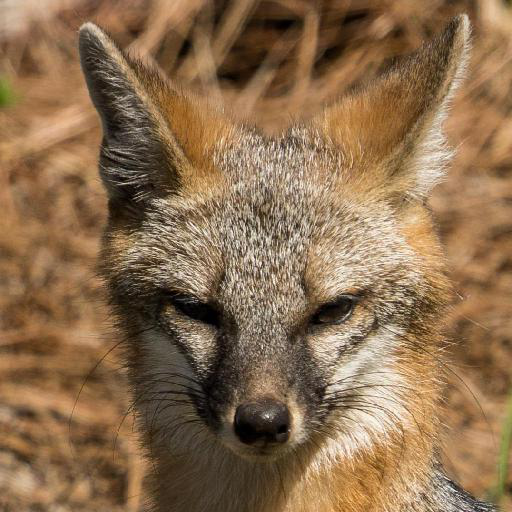

In [7]:
random.seed(42)
query_image = random.choice(images)
query_image.show()

Compute feature distances & Sort the images by the distances

In [8]:
dists = compute_dist(query_image, feats)
sorted_images, dists = sort_by_dist(images, dists)

Get N neighbors sorted by the feature distance (Ascending order)

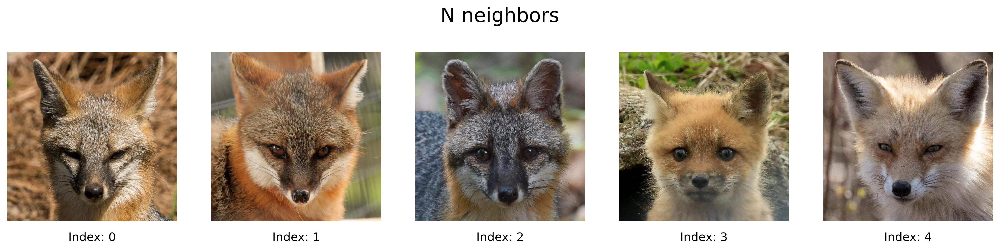

In [9]:
num_nearest = 5

fig = plt.figure(figsize=(18, 4), dpi=300)
plt.title("N neighbors", fontdict={'fontsize': 20})
plt.axis("off")

for i in range(num_nearest):
    ax = fig.add_subplot(1, num_nearest, i+1)
    ax.set_axis_off()
    ax.set_title(f"Index: {i}", y=-0.15)
    ax.imshow(sorted_images[i])

plt.show()

Get random samples

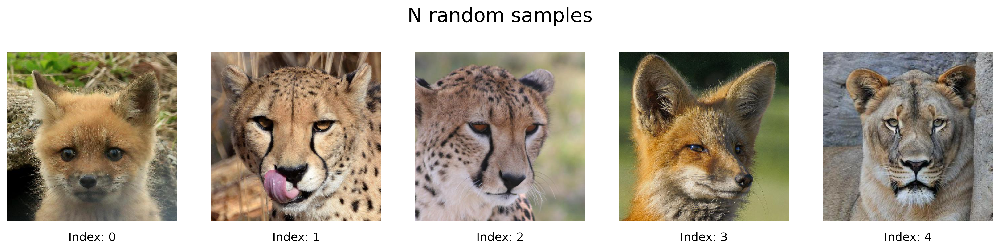

In [10]:
fig = plt.figure(figsize=(18, 4), dpi=300)
plt.title("N random samples", fontdict={'fontsize': 20})
plt.axis("off")

for i in range(num_nearest):
    ax = fig.add_subplot(1, num_nearest, i+1)
    ax.set_axis_off()
    ax.set_title(f"Index: {i}", y=-0.15)
    ax.imshow(random.choice(images))

plt.show()

Get N farthest samples sorted by the feature distance (Descending order)

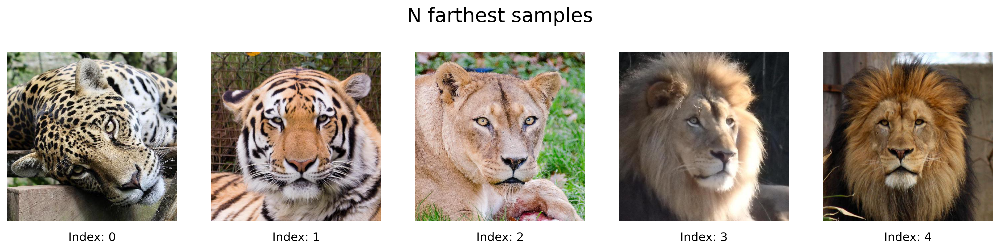

In [11]:
fig = plt.figure(figsize=(18, 4), dpi=300)
plt.title("N farthest samples", fontdict={'fontsize': 20})
plt.axis("off")

for i in range(num_nearest):
    ax = fig.add_subplot(1, num_nearest, i+1)
    ax.set_axis_off()
    ax.set_title(f"Index: {i}", y=-0.15)
    ax.imshow(sorted_images[len(sorted_images)-1-i])

plt.show()